# Explore STEREO-seq raw data

In [1]:
# Load libraries
# Select Kernel Pandas (Python 3.8.12)

import os
import numpy as np
import pandas as pd
import xarray as xr
import dask.dataframe as dd
import matplotlib.pyplot as plt
import seaborn as sns

from skimage.io import imread

In [2]:
def read_in_stereoSeq(path_genes,xcol='x',ycol='y',genecol='geneID',countcol='MIDCount',skiprows=0,offset=None):
    """This function read in Stereoseq input data to a dask datafrmae with predefined column names. 
    As we are working with BGI data, a column with counts is added."""
    in_df=dd.read_csv(path_genes,delimiter='\t',skiprows=skiprows)
    in_df=in_df.rename(columns={xcol:'x',ycol:'y',genecol:'gene',countcol:'counts'})
    if offset:
        in_df=micron_to_pixels(in_df,offset_x=offset[0],offset_y=offset[1])
    in_df=in_df.loc[:,['x','y','gene','counts']]
    
    in_df=in_df.dropna()
    return in_df

In [7]:
# Define files

paths = {}
paths.update({"image-wall": "/Users/yujike/Desktop/Innovation&Entrepreneurship/Computational_pipeline/Stereo-seq_pipeline/Experiment_2/C01828B1_FB.regist.tif"})
paths.update({"image-nucleus": "/Users/yujike/Desktop/Innovation&Entrepreneurship/Computational_pipeline/Stereo-seq_pipeline/Experiment_2/C01828B1.regist.tif"})
paths.update({"gem": "/Users/yujike/Desktop/Innovation&Entrepreneurship/Computational_pipeline/Stereo-seq_pipeline/Experiment_2/C01828B1.raw.gem"})

In [8]:
# Load data

## Images as numpy array
img_wall_raw_np    = imread(paths["image-wall"])
img_nucleus_raw_np = imread(paths["image-nucleus"])

## Transcripts as dask dataframe
gem_ddf = read_in_stereoSeq(paths["gem"], skiprows = 6, xcol = 'x', ycol = 'y')

---

# Plot images

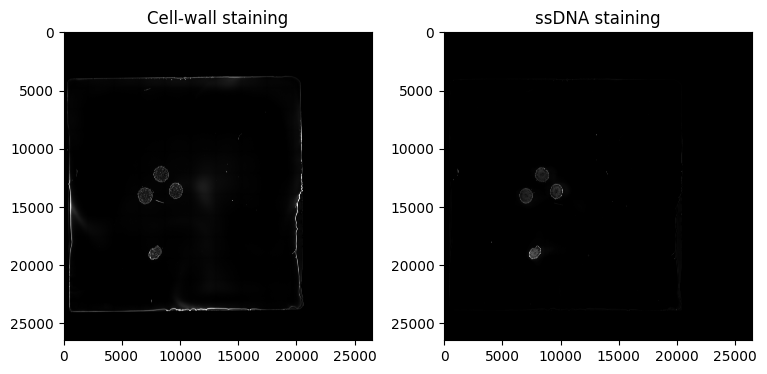

In [9]:
# Plot both images
fig, axs = plt.subplots(1, 2, figsize=(9, 4))

axs[0].imshow(img_wall_raw_np, cmap='gray')
axs[0].set_title("Cell-wall staining")

axs[1].imshow(img_nucleus_raw_np, cmap='gray')
axs[1].set_title("ssDNA staining")

plt.show()

In [10]:
# Define region of interest
roi_crd_dic   = {"row_y": (11000, 20000), "col_x": (5000, 11000)}
roi_crd_slice = (slice(roi_crd_dic["row_y"][0], roi_crd_dic["row_y"][1]),
                 slice(roi_crd_dic["col_x"][0], roi_crd_dic["col_x"][1]))

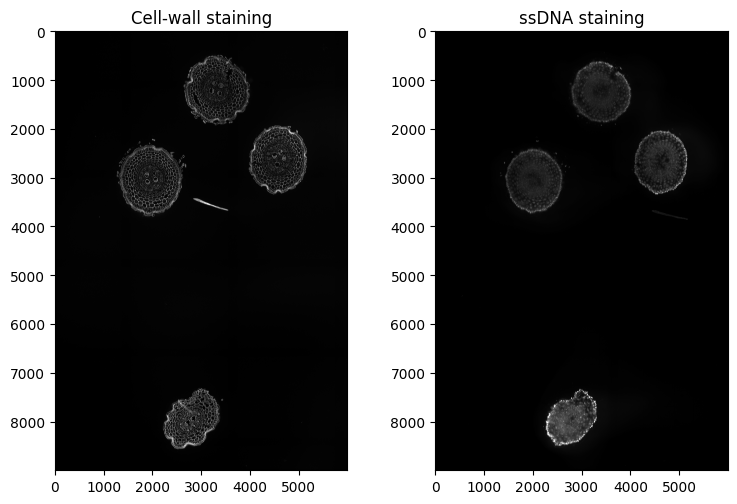

In [11]:
# Plot both images zoomed-in
fig, axs = plt.subplots(1, 2, figsize=(9, 5.7))

axs[0].imshow(img_wall_raw_np[roi_crd_slice], cmap='gray')
axs[0].set_title("Cell-wall staining")

axs[1].imshow(img_nucleus_raw_np[roi_crd_slice], cmap='gray')
axs[1].set_title("ssDNA staining")

plt.show()

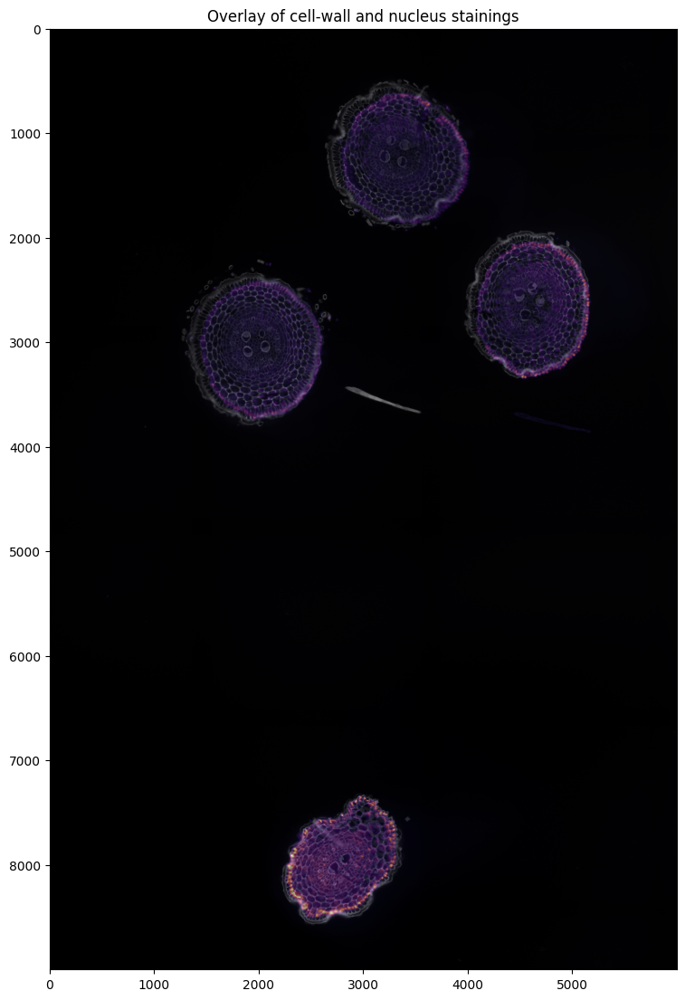

In [12]:
# Plot both images zoomed-in and overlayed
fig, ax = plt.subplots(figsize=(9, 13.5))

ax.imshow(img_wall_raw_np[roi_crd_slice], cmap='gray')
ax.imshow(img_nucleus_raw_np[roi_crd_slice], cmap = 'magma', alpha = 0.5)
ax.set_title("Overlay of cell-wall and nucleus stainings")

plt.show()

---

# Plot Genes

## Prepare genes

In [13]:
# Subset transcripts to region of interest
gem_roi_df = (gem_ddf.query(f'(x >= {roi_crd_dic["col_x"][0]}) & \
                              (x <= {roi_crd_dic["col_x"][1]}) & \
                              (y >= {roi_crd_dic["row_y"][0]}) & \
                              (y <= {roi_crd_dic["row_y"][1]}) ')
                 .compute())

## Reset coordinates
gem_roi_df["x"] = gem_roi_df["x"] - roi_crd_dic["col_x"][0]
gem_roi_df["y"] = gem_roi_df["y"] - roi_crd_dic["row_y"][0]

In [14]:
# Aggregates transcripts (all genes)

## Total number of transcript per coordinates
gem_roi_total_df = gem_roi_df.groupby(["x", "y"]).agg({"counts": "sum"}).reset_index()

## Total number of transcript per bin 20 of coordinates
gem_roi_total_bin20_df = (gem_roi_total_df
    .assign(x_bin20 = lambda x: x.x // 20 * 20 + 20 / 2)
    .assign(y_bin20 = lambda x: x.y // 20 * 20 + 20 / 2)
    .groupby(['x_bin20', 'y_bin20'])['counts'].sum().reset_index())

## Total number of transcript per bin 50 of coordinates
gem_roi_total_bin50_df = (gem_roi_total_df
    .assign(x_bin50 = lambda x: x.x // 50 * 50 + 50 / 2)
    .assign(y_bin50 = lambda x: x.y // 50 * 50 + 50 / 2)
    .groupby(['x_bin50', 'y_bin50'])['counts'].sum().reset_index())

## Distribution

Text(1, 0, 'Bins of 10 transcripts')

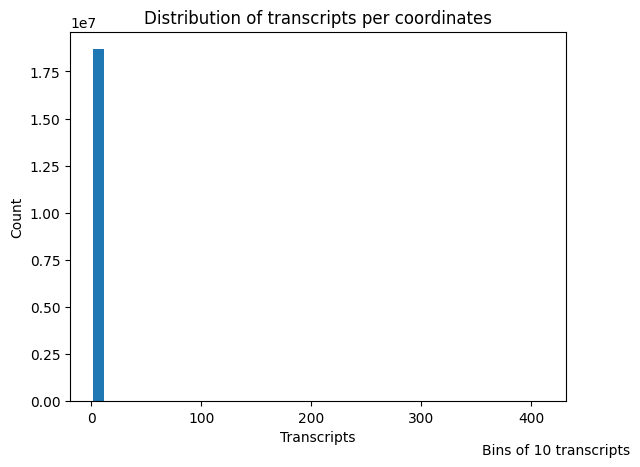

In [15]:
# Plot transcript density per coordinates
fig, ax = plt.subplots()

ax.hist(gem_roi_total_df["counts"],
        bins = range(min(gem_roi_total_df["counts"]), max(gem_roi_total_df["counts"]) + 10, 10))

ax.set_title("Distribution of transcripts per coordinates")
ax.set_xlabel("Transcripts")
ax.set_ylabel("Count")

plt.figtext(1, 0, "Bins of 10 transcripts", horizontalalignment = "right")

## All genes

/var/folders/ch/nyzh10996mzbm4r4pj4m0qd00000gn/T/ipykernel_14425/2440324127.py:6: FutureWarning: In a future version of pandas all arguments of DataFrame.pivot will be keyword-only.
  transcript_img    = gem_roi_total_bin20_df.pivot('y_bin20', 'x_bin20', 'counts')


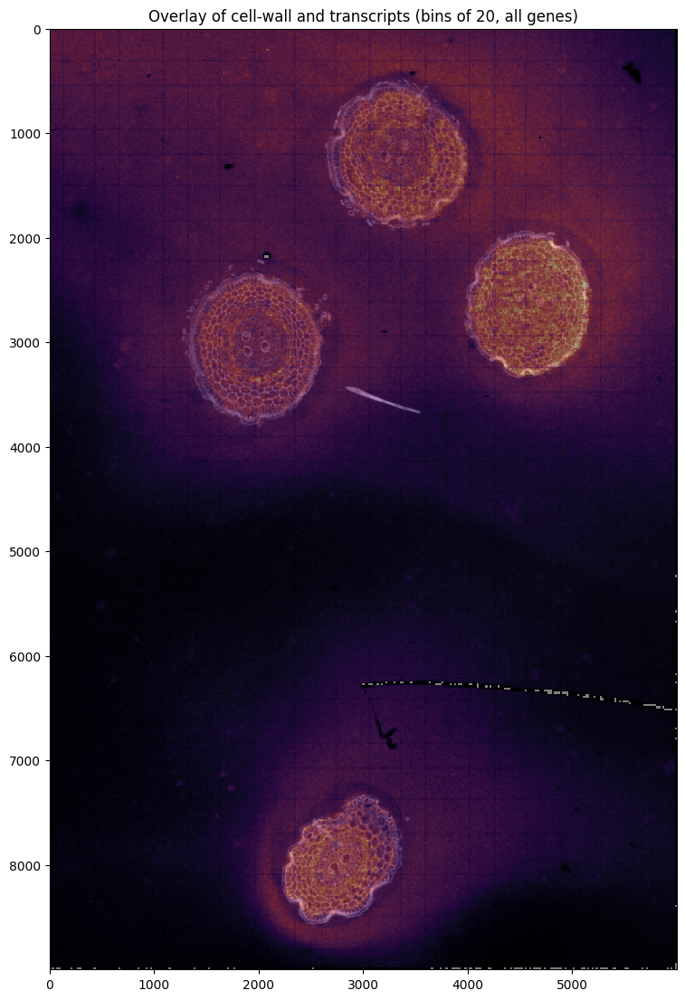

In [16]:
# Plot all transcripts (bin 20) over cell-wall image

fig, ax = plt.subplots(figsize=(9, 13.5))

# Transcripts (imshow)
transcript_img    = gem_roi_total_bin20_df.pivot('y_bin20', 'x_bin20', 'counts')
transcript_extent = [gem_roi_total_bin20_df['x_bin20'].min()-10,  # left
                     gem_roi_total_bin20_df['x_bin20'].max()-10,  # right
                     gem_roi_total_bin20_df['y_bin20'].max()-10,  # bottom
                     gem_roi_total_bin20_df['y_bin20'].min()-10]  # top

ax.imshow(transcript_img, interpolation = "nearest", cmap = "magma", alpha = 1,
          extent = transcript_extent)

# Image
ax.imshow(img_wall_raw_np[roi_crd_slice], cmap='gray', alpha = 0.5)

# # Transcripts (scatter)
# ax.scatter(data = gem_roi_total_bin20_df,
#            x = "x_bin20", y = "y_bin20", c = "counts", cmap = "magma",
#            alpha = 0.25, marker = "s", s = 4)

ax.set_title("Overlay of cell-wall and transcripts (bins of 20, all genes)")

plt.show()

/var/folders/ch/nyzh10996mzbm4r4pj4m0qd00000gn/T/ipykernel_14425/1441399285.py:6: FutureWarning: In a future version of pandas all arguments of DataFrame.pivot will be keyword-only.
  transcript_img    = gem_roi_total_bin20_df.pivot('y_bin20', 'x_bin20', 'counts')


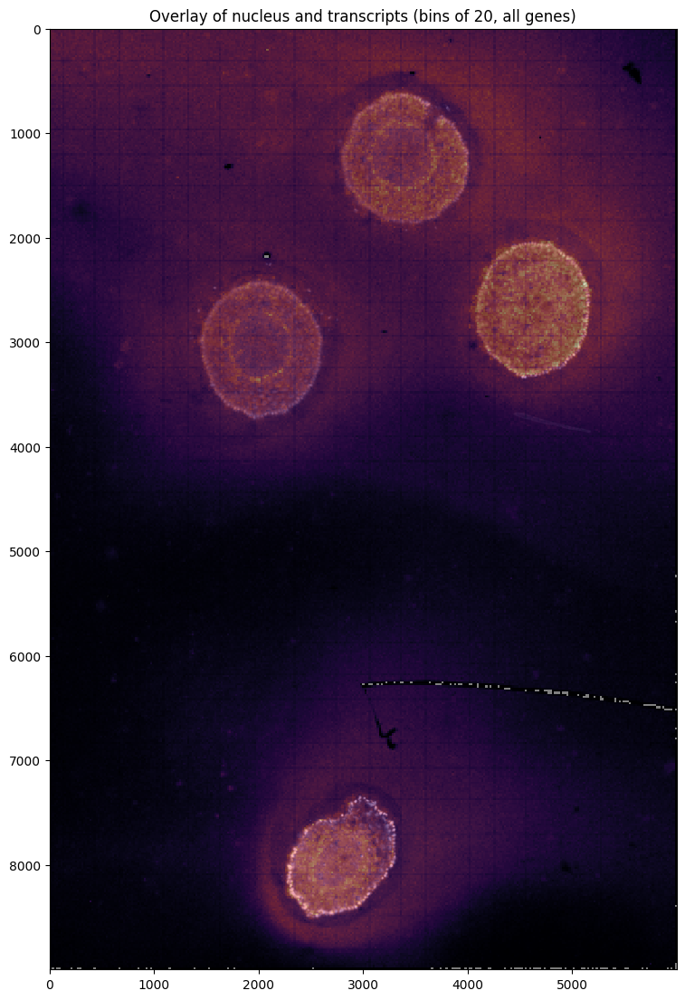

In [17]:
# Plot all transcripts (bin 20) over nucleus image

fig, ax = plt.subplots(figsize=(9, 13.5))

# Transcripts (imshow)
transcript_img    = gem_roi_total_bin20_df.pivot('y_bin20', 'x_bin20', 'counts')
transcript_extent = [gem_roi_total_bin20_df['x_bin20'].min()-10,  # left
                     gem_roi_total_bin20_df['x_bin20'].max()-10,  # right
                     gem_roi_total_bin20_df['y_bin20'].max()-10,  # bottom
                     gem_roi_total_bin20_df['y_bin20'].min()-10]  # top

ax.imshow(transcript_img, interpolation = "nearest", cmap = "magma", alpha = 1,
          extent = transcript_extent)

# Image
ax.imshow(img_nucleus_raw_np[roi_crd_slice], cmap='gray', alpha = 0.5)

ax.set_title("Overlay of nucleus and transcripts (bins of 20, all genes)")

plt.show()

---

## Genes of interest

In [18]:
def filter_to_goi(genes: list):
    return gem_roi_df[gem_roi_df["gene"].isin(genes)].sample(frac=1).sort_values(by = "counts", ascending = True)


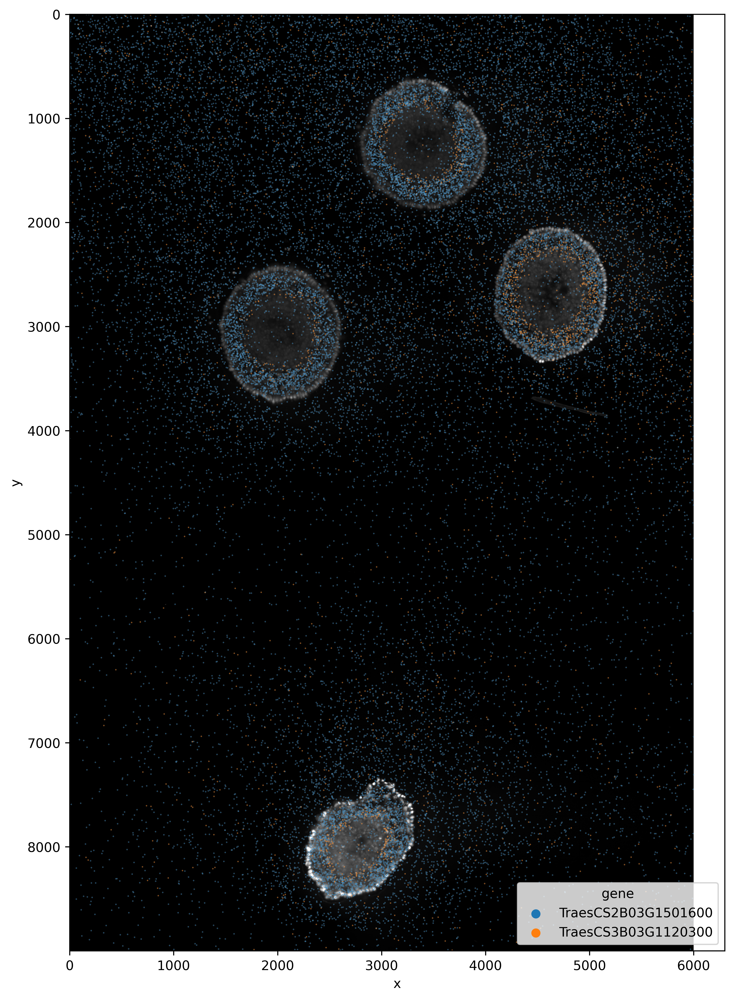

In [19]:
# Plot transcripts for gene of interest

genes = ["TraesCS3B03G1120300", "TraesCS2B03G1501600"]  # Cortex
# genes = ["TraesCS5D03G0377000", "TraesCS5B03G0387000", "TraesCS1A03G0062800"]  # Xylem
# genes = ["TraesCS4D03G0748700", "TraesCS4B03G0840800"]  # Pericycle 1
# genes = ["TraesCS1B03G0048800", "TraesCS1D03G0038800"]  # Actin

fig, ax = plt.subplots(figsize=(9, 13.5), dpi=600)

# Image
ax.imshow(img_nucleus_raw_np[roi_crd_slice], cmap='gray')

# Transcripts (scatter)
sns.scatterplot(data = filter_to_goi(genes), x = "x", y = "y", hue = "gene", alpha = 0.5, s = 1)

plt.show()